## Reprogramming demo

In [1]:
import sdevelo as sv
import cellrank as cr
import pandas as pd

adata = cr.datasets.reprogramming_morris()

# Remove rows where 'reprogramming_day' is NaN
adata = adata[~pd.isna(adata.obs['reprogramming_day']), :]

args = sv.Config()
sv.cuda_device = 1
args.vis_type_col = 'reprogramming_day'


(Working on SDEvelo)
2024-09-13 15:27:51


In [2]:
model = sv.SDENN(args, adata)
adata = model.train(args.nEpochs)

cuda
Filtered out 11025 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:02:58) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:11) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
5000
Epoch: 0, Loss: 1.073, alpha: 0.01, beta: 0.89, gamma: 0.01, s1: 0.019, s2: 0.027,  t_m: 0.100,  u_shift: 0.000,  s_shift: 0.000
Epoch: 50, Loss: 0.523, alpha: 0.01, beta: 4.15, gamma: 10.12, s1: 0.010, s2: 0.134,  t_m: 0.118,  u_shift: 0.000,  s_shift: 0.000
Epoch: 100, Loss: 0.438, alpha: 0.01, beta: 4.58, gamma: 16.61, s1: 0.010, s2: 0.188,  t_m: 0.143,  u_shift: 0.000,  s_shift: 0.000
Epoch: 150, Loss: 0.386, alpha: 0.01, beta: 5.09, gamma: 22.04, s1: 0.010, s2: 0.222,  t_m: 0.170,  u_shift: 0.000,  s_shift: 0.000
Epoch: 200, Loss: 0.388, a

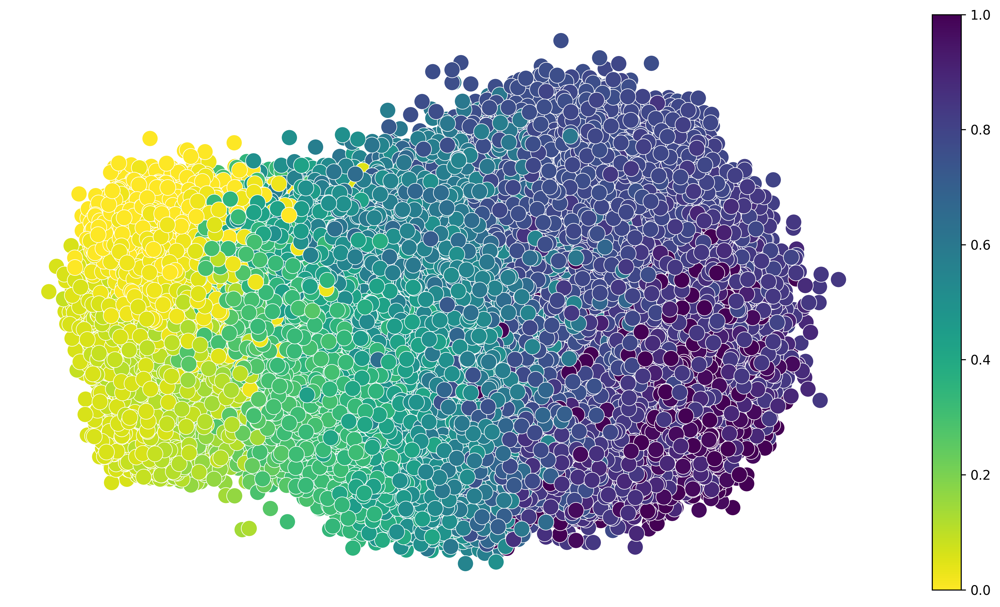

In [4]:
sv.plot_latent_time(adata, args)

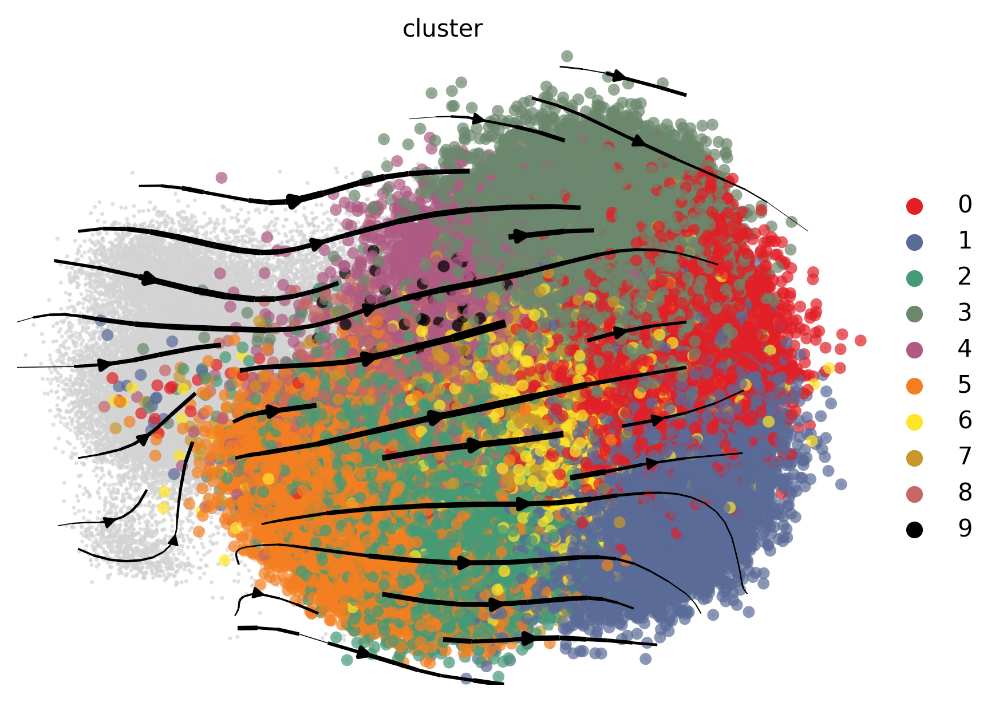

In [5]:
import scvelo as scv
import warnings
from matplotlib import MatplotlibDeprecationWarning


# Suppress specific MatplotlibDeprecationWarning from the mentioned module
warnings.filterwarnings("ignore", category=MatplotlibDeprecationWarning, module="scvelo.plotting.utils")

scv.pl.velocity_embedding_stream(adata, density=0.5,  linewidth=2.0, basis='pca', dpi=300, s=100, alpha=0.7, 
                                 vkey='sde_velocity', color='cluster', legend_loc='right margin')

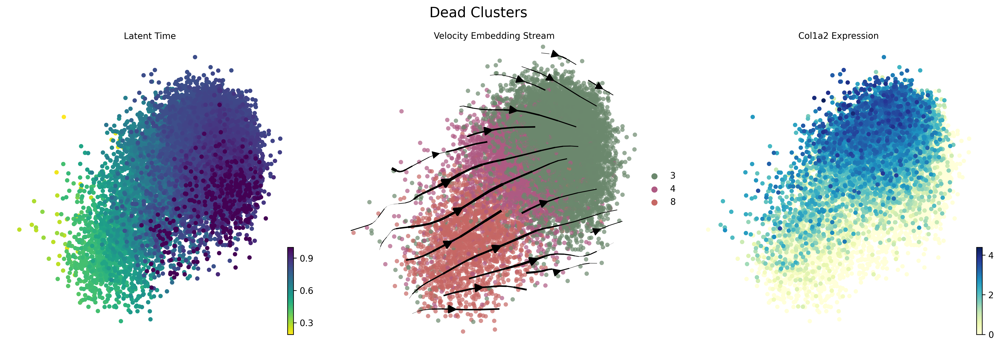

In [6]:
# Plot for "dead" clusters
dead_clusters = ['8', '4', '3']
fig1 = sv.plot_subset(adata, dead_clusters, 'Col1a2', 'Dead Clusters')

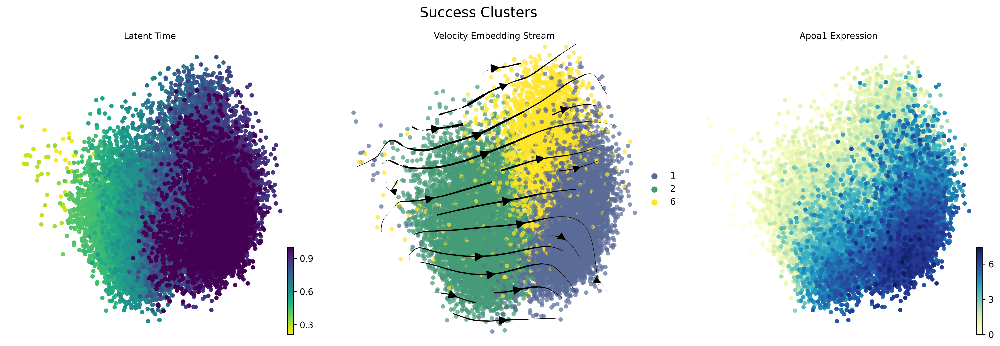

In [7]:
# Plot for "success" clusters
success_clusters = ['2', '6', '1']
fig2 = sv.plot_subset(adata, success_clusters, 'Apoa1', 'Success Clusters')
